I chose Clare Malone's article, "What Does Robert F. Kennedy, Jr., Actually Want?" from The New Yorker because it provides a comprehensive and nuanced exploration of a controversial figure in contemporary American politics. Robert F. Kennedy, Jr.'s presidential campaign has sparked significant debate, and I am interested in understanding the complexities of his political views, the motivations behind his candidacy, and how he is perceived by the public and his family. Through this article, I aim to gain insights into the factors that have shaped Kennedy's political journey, the challenges he faces, and the potential impact of his campaign on the broader political landscape. Additionally, I am curious to explore how Malone's journalistic approach sheds light on the intersections of media, politics, and public perception in the context of a highly scrutinized presidential race.

Citation for The New Yorker Article
Malone, C. (2024, August 5). "What does Robert F. Kennedy, Jr., actually want?", The New Yorker. https://www.newyorker.com/magazine/2024/08/12/robert-f-kennedy-jr-profile-presidential-campaign

In [1]:
import spacy
from docx import Document
from nltk.corpus import PlaintextCorpusReader
from nltk.tokenize import sent_tokenize, word_tokenize
import nltk
from collections import Counter

import matplotlib.pyplot as plt

import warnings

warnings.filterwarnings("ignore")

In [2]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /Users/jcw81/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [3]:
processor = spacy.load('en_core_web_sm')

In [4]:
document = Document("/Users/jcw81/Desktop/JHU/Semester 3/MLNN/Assignment 13/Robert Kennedy.docx")

text = "\n".join([paragraph.text for paragraph in document.paragraphs])

processed_text = processor(text)
processed_text

What Does Robert F. Kennedy, Jr., Actually Want?
The third-party Presidential candidate has a troubled past, a shambolic campaign, and some surprisingly good poll numbers.
By Clare Malone
August 5, 2024

“It’s almost like he’s been body-snatched,” one longtime friend said. “I look at pictures of him, and he’s unrecognizable. His sense of humor is all but gone. There’s this anger.”Photograph by Dan Winters for The New Yorker
In December of 2021, the pollster Jeremy Zogby began designing a national survey to capture the radical changes that he believed were under way in American life nearly two years into the pandemic. Zogby, who is an avid reader of the psychologist Carl Jung, was especially curious about the kinds of people that Americans considered “heroic,” and he came up with a list of archetypes. There was the spiritual leader, the Pope; the female entrepreneur, Oprah; the rogue pundit, Tucker Carlson; and the philanthropist-scientist, Bill Gates. Joe Biden and Donald Trump, as the

In [5]:
tokens = [token for token in processed_text if not token.is_stop and not token.is_punct]

### Most common words

In [6]:
word_freq = Counter(tokens)

most_common_words = word_freq.most_common(20)

print("Most common words:")
for word, freq in most_common_words:
    print(f"{word}: {freq}")

Most common words:
Robert: 1
F.: 1
Kennedy: 1
Jr.: 1
Actually: 1
Want: 1

: 1
party: 1
Presidential: 1
candidate: 1
troubled: 1
past: 1
shambolic: 1
campaign: 1
surprisingly: 1
good: 1
poll: 1
numbers: 1

: 1
 : 1


In [7]:
word_counts = {
    'kennedy': 266,
    '': 100,  
    'say': 92,
    ' ': 86,  
    'tell': 50,
    'campaign': 36,
    'friend': 33,
    'trump': 30,
    'go': 29,
    'year': 27,
    'vaccine': 24,
    'think': 24,
    'richardson': 24,
    'new': 22,
    'child': 18,
    'later': 18,
    'woman': 18,
    'early': 17,
    'call': 17,
    'father': 17
}

cleaned_word_counts = {word: count for word, count in word_counts.items() if word.strip()}


for word, count in cleaned_word_counts.items():
    print(f"{word}: {count}")


kennedy: 266
say: 92
tell: 50
campaign: 36
friend: 33
trump: 30
go: 29
year: 27
vaccine: 24
think: 24
richardson: 24
new: 22
child: 18
later: 18
woman: 18
early: 17
call: 17
father: 17


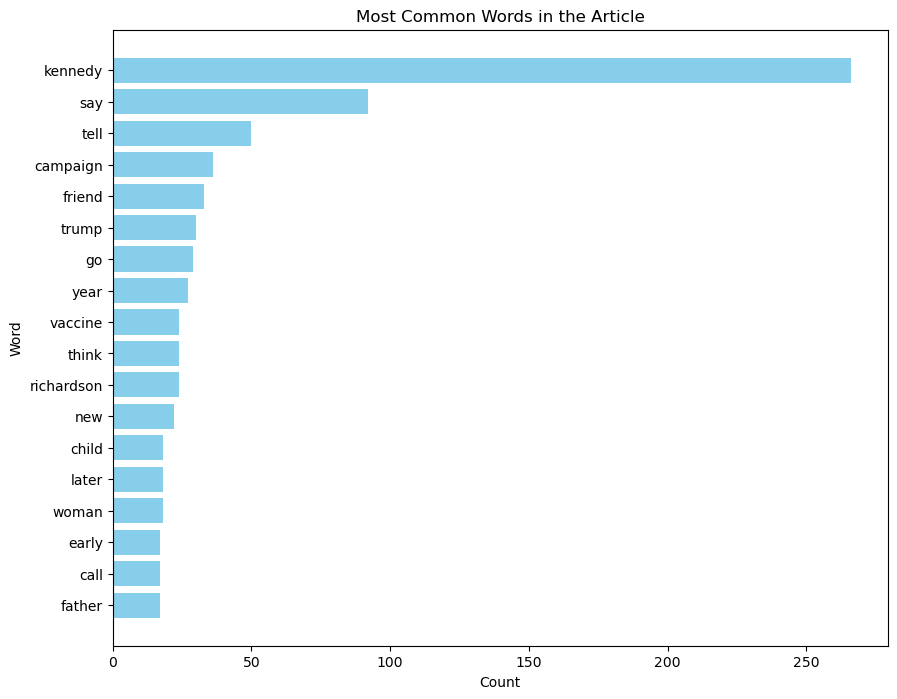

In [8]:
plt.figure(figsize=(10, 8))
plt.barh(list(cleaned_word_counts.keys()), list(cleaned_word_counts.values()), color='skyblue')
plt.xlabel('Count')
plt.ylabel('Word')
plt.title('Most Common Words in the Article')
plt.gca().invert_yaxis()  # Invert y-axis to show the highest frequency at the top
plt.show()

In [9]:
nouns = [token.text.lower() for token in processed_text if token.pos_ == 'NOUN' and not token.is_stop and token.is_alpha]

noun_freq = Counter(nouns)

most_common_nouns = noun_freq.most_common(20)

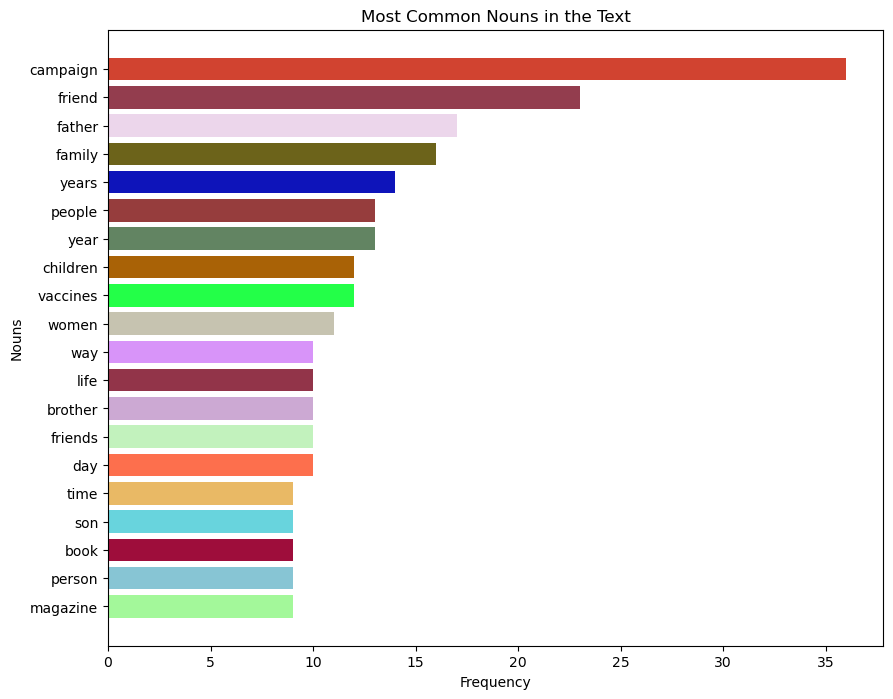

In [10]:
import random

words, counts = zip(*most_common_nouns)

colors = ['#%06X' % random.randint(0, 0xFFFFFF) for _ in range(len(words))]

plt.figure(figsize=(10, 8))
plt.barh(words, counts, color = colors)
plt.xlabel('Frequency')
plt.ylabel('Nouns')
plt.title('Most Common Nouns in the Text')
plt.gca().invert_yaxis()  # Invert y-axis to have the most frequent word at the top
plt.show()

### Tokenize the Text

In [11]:
n = 0
for sentence in processor(text).sents:
    print(n, sentence)
    n += 1


0 What Does Robert F. Kennedy, Jr., Actually Want?

1 The third-party Presidential candidate has a troubled past, a shambolic campaign, and some surprisingly good poll numbers.

2 By Clare Malone
August 5, 2024

“It’s almost like he’s been body-snatched,” one longtime friend said.
3 “I look at pictures of him, and he’s unrecognizable.
4 His sense of humor is all but gone.
5 There’s this anger.
6 ”Photograph
7 by Dan Winters for The New Yorker

8 In December of 2021, the pollster Jeremy Zogby began designing a national survey to capture the radical changes that he believed were under way in American life nearly two years into the pandemic.
9 Zogby, who is an avid reader of the psychologist Carl Jung, was especially curious about the kinds of people that Americans considered “heroic,” and he came up with a list of archetypes.
10 There was the spiritual leader, the Pope; the female entrepreneur, Oprah; the rogue pundit, Tucker Carlson; and the philanthropist-scientist, Bill Gates.
11 Joe 

In [12]:
n = 0
for sentence in processor(text).sents:
    for token in sentence:
        print(n, token, token.pos_, token.text, token.lemma_)
    n += 1

0 What PRON What what
0 Does AUX Does do
0 Robert PROPN Robert Robert
0 F. PROPN F. F.
0 Kennedy PROPN Kennedy Kennedy
0 , PUNCT , ,
0 Jr. PROPN Jr. Jr.
0 , PUNCT , ,
0 Actually ADV Actually actually
0 Want VERB Want want
0 ? PUNCT ? ?
0 
 SPACE 
 

1 The DET The the
1 third ADJ third third
1 - PUNCT - -
1 party NOUN party party
1 Presidential ADJ Presidential presidential
1 candidate NOUN candidate candidate
1 has VERB has have
1 a DET a a
1 troubled ADJ troubled troubled
1 past NOUN past past
1 , PUNCT , ,
1 a DET a a
1 shambolic ADJ shambolic shambolic
1 campaign NOUN campaign campaign
1 , PUNCT , ,
1 and CCONJ and and
1 some DET some some
1 surprisingly ADV surprisingly surprisingly
1 good ADJ good good
1 poll NOUN poll poll
1 numbers NOUN numbers number
1 . PUNCT . .
1 
 SPACE 
 

2 By ADP By by
2   SPACE    
2 Clare PROPN Clare Clare
2 Malone PROPN Malone Malone
2 
 SPACE 
 

2 August PROPN August August
2 5 NUM 5 5
2 , PUNCT , ,
2 2024 NUM 2024 2024
2 

 SPACE 

 


2 “ PUNCT “ 

### Subject/object relationships

In [13]:
def pr_tree(word, level):
    if word.is_punct:
        return
    for child in word.lefts:
        pr_tree(child, level+1)
    print('\t' * level + word.text + ' _ ' + word.dep_)
    for child in word.rights:
        pr_tree(child, level+1)

In [14]:
for sentence in processed_text.sents:
    pr_tree(sentence.root, 0)
    print('-------------------------------------------------')

	What _ dobj
	Does _ aux
		Robert _ compound
		F. _ compound
	Kennedy _ nsubj
		Jr. _ appos
	Actually _ advmod
Want _ ROOT
-------------------------------------------------
		The _ det
			third _ amod
		party _ nmod
		Presidential _ amod
	candidate _ nsubj
has _ ROOT
		a _ det
		troubled _ amod
	past _ dobj
			a _ det
			shambolic _ amod
		campaign _ appos
			and _ cc
				some _ det
					surprisingly _ advmod
				good _ amod
				poll _ compound
			numbers _ conj
-------------------------------------------------
		By _ prep
			  _ dep
			Clare _ pobj
				Malone _ compound
					
 _ dep
			August _ pobj
				5 _ nummod
				2024 _ nummod
					

 _ dep
		It _ nsubj
	’s _ ccomp
		almost _ advmod
			like _ mark
			he _ nsubjpass
			’s _ auxpass
		been _ advcl
				body _ npadvmod
			snatched _ acomp
		one _ nummod
		longtime _ compound
	friend _ nsubj
said _ ROOT
-------------------------------------------------
	I _ nsubj
look _ ROOT
	at _ prep
		pictures _ pobj
			of _ prep
				him _ pobj
	an

In [15]:
for sent in processed_text.sents:
    for token in sent:
        print(token, token.vector)

What [ 1.0079093  -0.21649075  0.5707804   2.2793527  -1.1618687  -1.0050514
  1.1687851  -0.32592416 -1.7707893  -1.3098956   1.4671588   2.2409427
 -1.2562313  -1.0785084  -0.40954655 -0.8913717  -0.5582185  -1.3739091
 -0.73732835  0.844259   -1.4563553   0.39726555  2.0773644  -1.4641875
 -0.34558898  0.747668    0.05293041  1.0424674  -0.8211044   1.1975484
 -1.0673099  -0.6331887  -0.00687388 -1.4398295  -0.9627532   0.26911855
 -0.9330084   0.87179846 -0.11039591  1.1680989  -1.8049144  -1.0386428
  0.9974621  -0.4761867   0.47155926 -1.5689249   0.07368428  0.50160867
 -0.24588133  0.9763176  -0.19549236  0.903021    0.18539716  1.93856
 -0.08775586 -0.03701776 -0.28882527  0.16019195  1.1190314   2.0004816
  0.38567847  1.9376309  -0.90728664  0.8967962   1.2279191   1.9178764
  0.16063924  0.1794483  -0.12453948 -0.613454   -0.21351197 -0.98326397
 -0.22802463 -1.2378678  -1.0835938   0.50517464 -0.91140354  1.5712638
 -0.03017008  0.5440472  -0.29224685 -0.30833796 -1.044916

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 0.14314342 -0.4459604   0.22987837  0.04551572 -0.0888283  -1.2134154
  0.6099788  -1.2001643   0.08538319  0.64408135 -0.5608462  -1.1345105
 -0.1327711  -0.6004329   0.9934776  -0.32600644 -0.48618555  1.749015
  0.01603174  0.30568162  0.21972293 -1.0813999  -0.4458138  -0.9844902
  1.9390091  -0.51276934  1.0597544  -0.19679287  0.6401892  -0.39740574
 -0.17510775 -0.7553948   1.7869587   0.8290934  -0.42914718  0.5449647
  0.42910573  0.1572139   0.56441796 -0.44616896 -0.1090549  -0.8047535
 -0.84681076 -1.206316    0.7411182   0.1333792   0.5717175  -0.25383905
 -0.9946283  -1.27721    -1.2313541   0.41722897  0.11067796 -0.21905197
 -1.6160456   0.20449308 -0.64588004 -0.4125811   0.40441453 -0.29623252
  0.10997795 -1.87832    -0.4464915   0.80082613  0.21535903  0.4545164
  0.9444312  -0.77534866  1.2287185   0.8298635   0.39772654 -0.81416357
 -0.71460223  0.5188441  -0.66276234  1.1745791  -0.19037956  0.83743405
  1.0965444  -0.44697046  0.12225226  0.5744189  -0.3826865

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[-0.6047532  -0.99025416 -0.8528034  -1.3764391   0.21652919  2.2724767
  0.42312747  0.2933914  -0.24106613 -0.71474344  2.0567577  -1.3389425
 -0.8093252   1.5853419   0.04847489  0.33910614 -1.5501753  -1.0465614
  1.9763466  -0.26920503  0.17312807 -0.5173871   1.3131684   0.01743793
  0.8329106   2.502883    0.20289654  0.63676685 -0.02095721  1.6534824
  0.54524714  1.2173876   1.7633461   0.36143038 -0.45649135 -0.52730405
 -0.12151954  0.10983306 -0.8611319   0.43200785  1.5257419  -0.14821939
  0.14940748 -0.3794372  -0.1780446  -0.27419925 -0.26394665 -0.3077471
  1.6158533   0.03442484  3.284014   -1.0091763  -0.8317764   0.7840668
  1.1058881  -1.6235518  -1.14535    -1.0219043  -0.02184421 -0.6401657
 -0.6375164  -2.0644822  -0.1737309   0.9654503   0.07837912 -0.4492642
 -0.24127123 -0.34241176 -0.1138148  -0.8204598   0.14409605  0.13394552
 -1.1130812  -1.0785929   1.7224517  -0.09347941 -0.27506578  1.8538907
 -0.21807373 -1.5037556  -0.82387054 -0.9061092  -0.3530549 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [16]:
entities = [(entity.text, entity.label_) for entity in processed_text.ents]

entity_freq = Counter(entities)

most_common_entities = entity_freq.most_common(10)

entity_names, entity_types, counts = zip(*[(entity, entity_type, count) for (entity, entity_type), count in most_common_entities])

print("Most common entities and their types:")
for (entity, entity_type), count in most_common_entities:
    print(f"{entity} ({entity_type}): {count}")

Most common entities and their types:
Kennedy (PERSON): 233
Trump (ORG): 22
Richardson (PERSON): 22
Biden (PERSON): 14
Bobby (PERSON): 10
Harvard (ORG): 10
one (CARDINAL): 9
David (PERSON): 9
Fox Kennedy (PERSON): 8
New York (GPE): 8


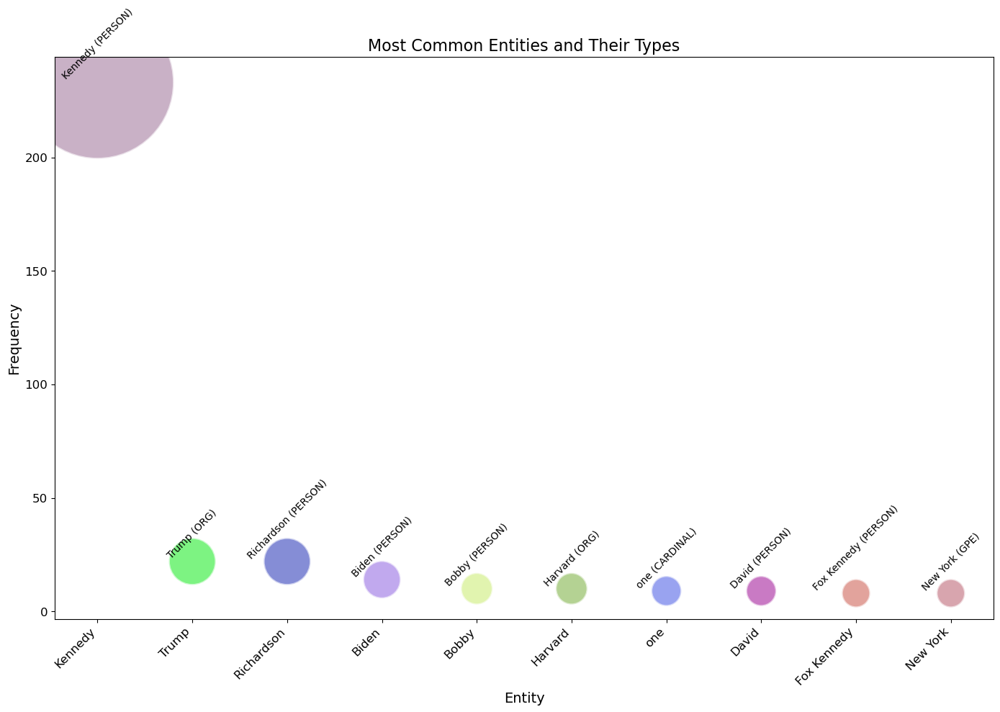

In [17]:
colors = ['#%06X' % random.randint(0, 0xFFFFFF) for _ in range(len(entity_names))]

# Create the bubble chart
plt.figure(figsize=(14, 10))
plt.scatter(entity_names, counts, s=[count * 100 for count in counts], c=colors, alpha=0.6, edgecolors="w", linewidth=2)

# Add annotations with improved readability
for i, name in enumerate(entity_names):
    plt.text(i, counts[i] + 0.5, f"{name} ({entity_types[i]})", ha='center', va='bottom', fontsize=10, rotation=45)

# Title and labels
plt.title('Most Common Entities and Their Types', fontsize=16)
plt.xlabel('Entity', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

# Adjust layout to prevent clipping
plt.tight_layout()

# Show the plot
plt.show()

In [18]:
entity_dependencies = []

for sentence in processed_text.sents:
    for entity in sentence.ents:
        entity_root = entity.root  
        head = entity_root.head    
        entity_dependencies.append((entity.text, entity.label_, entity_root.dep_, head.text))

for entity_text, entity_label, entity_dep, head_text in entity_dependencies:
    print(f"Entity: {entity_text}, Type: {entity_label}, Dependency: {entity_dep}, Head: {head_text}")

Entity: Robert F. Kennedy, Type: PERSON, Dependency: nsubj, Head: Want
Entity: Jr., Type: PERSON, Dependency: appos, Head: Kennedy
Entity: third, Type: ORDINAL, Dependency: amod, Head: party
Entity: Clare Malone, Type: PERSON, Dependency: pobj, Head: By
Entity: August 5, 2024, Type: DATE, Dependency: pobj, Head: By
Entity: one, Type: CARDINAL, Dependency: nummod, Head: friend
Entity: Dan Winters, Type: PERSON, Dependency: pobj, Head: by
Entity: The New Yorker, Type: ORG, Dependency: pobj, Head: for
Entity: December of 2021, Type: DATE, Dependency: pobj, Head: In
Entity: Jeremy Zogby, Type: PERSON, Dependency: appos, Head: pollster
Entity: American, Type: NORP, Dependency: amod, Head: life
Entity: nearly two years, Type: DATE, Dependency: npadvmod, Head: into
Entity: Zogby, Type: GPE, Dependency: nsubj, Head: was
Entity: Carl Jung, Type: PERSON, Dependency: pobj, Head: of
Entity: Americans, Type: NORP, Dependency: nsubj, Head: considered
Entity: Oprah, Type: PERSON, Dependency: appos, H

Dependency   ROOT  acomp  advmod  amod  appos  attr  aux  compound  conj  \
Type                                                                       
CARDINAL        0      0       1     0      1     5    0         0     0   
DATE            0      1      20     5      2     3    0         3     0   
EVENT           0      0       0     0      0     0    0         1     0   
FAC             0      0       0     0      0     0    0         0     0   
GPE             0      0       0     0      8     0    0        11     5   
LOC             0      0       0     0      0     0    0         1     1   
MONEY           0      0       0     0      0     0    0         0     0   
NORP            0      0       0    18      1     1    0         2     2   
ORDINAL         0      0       2     9      0     1    0         1     0   
ORG             0      0       0     1      3     1    0        17     3   
PERSON          1      1       1     0     39     3    1        12    19   
PRODUCT     

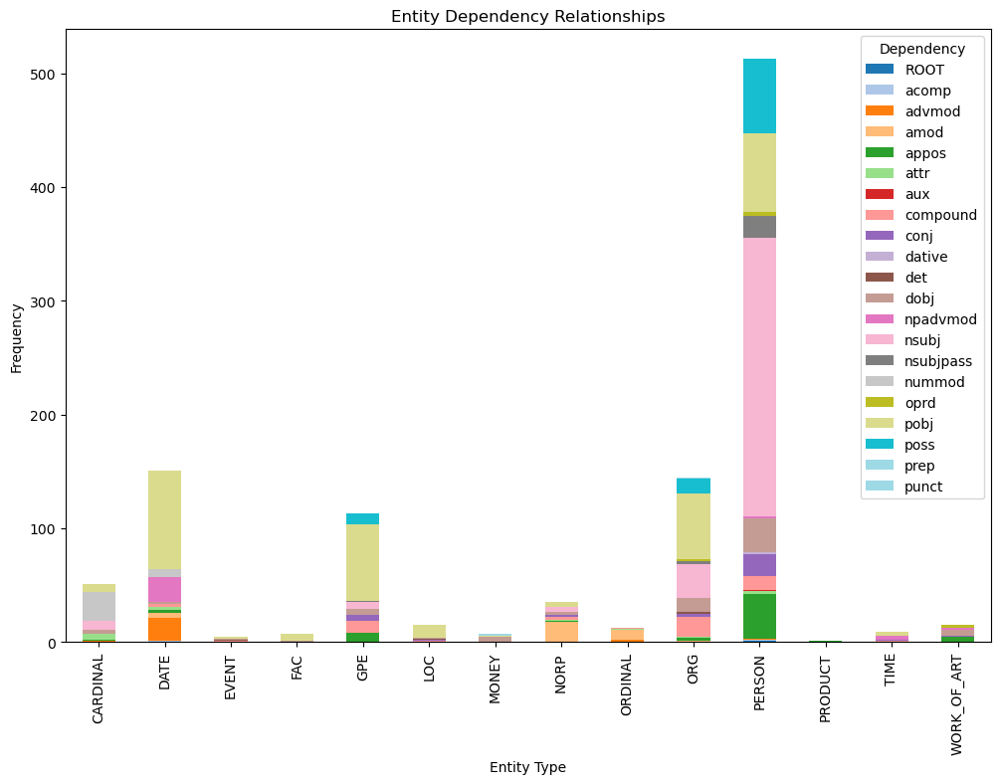

In [19]:
import pandas as pd

df = pd.DataFrame(entity_dependencies, columns=["Entity", "Type", "Dependency", "Head"])

dependency_freq = df.groupby(["Type", "Dependency"]).size().unstack(fill_value=0)

print(dependency_freq)

dependency_freq.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='tab20')
plt.title('Entity Dependency Relationships')
plt.xlabel('Entity Type')
plt.ylabel('Frequency')
plt.show()

In [20]:
for token in tokens:
    print(token.text, token.lemma_, token.pos_)

from itertools import combinations

similarities = []
for token1, token2 in combinations(tokens, 2):
    similarity = token1.similarity(token2)
    similarities.append((token1.text, token2.text, similarity))

similarities = sorted(similarities, key=lambda x: x[2], reverse=True)

print("Top 10 most similar words:")
for word1, word2, sim in similarities[:10]:
    print(f"{word1} - {word2}: {sim:.4f}")

Robert Robert PROPN
F. F. PROPN
Kennedy Kennedy PROPN
Jr. Jr. PROPN
Actually actually ADV
Want want VERB

 
 SPACE
party party NOUN
Presidential presidential ADJ
candidate candidate NOUN
troubled troubled ADJ
past past NOUN
shambolic shambolic ADJ
campaign campaign NOUN
surprisingly surprisingly ADV
good good ADJ
poll poll NOUN
numbers number NOUN

 
 SPACE
    SPACE
Clare Clare PROPN
Malone Malone PROPN

 
 SPACE
August August PROPN
5 5 NUM
2024 2024 NUM


 

 SPACE
like like SCONJ
body body NOUN
snatched snatch VERB
longtime longtime NOUN
friend friend NOUN
said say VERB
look look VERB
pictures picture NOUN
unrecognizable unrecognizable ADJ
sense sense NOUN
humor humor NOUN
gone go VERB
anger anger NOUN
”Photograph ”photograph NOUN
Dan Dan PROPN
Winters Winters PROPN
New New PROPN
Yorker Yorker PROPN

 
 SPACE
December December PROPN
2021 2021 NUM
pollster pollster NOUN
Jeremy Jeremy PROPN
Zogby Zogby PROPN
began begin VERB
designing design VERB
national national ADJ
survey survey NO

KeyboardInterrupt: 

In [21]:
target_word = processor("campaign")[0]  

kennedy = biden = trump = vaccine = None
politics = health = government = freedom = rights = justice = policy = election = None

for token in processed_text:
    if token.text.lower() == 'kennedy':
        kennedy = token
    elif token.text.lower() == 'biden':
        biden = token
    elif token.text.lower() == 'trump':
        trump = token
    elif token.text.lower() == 'vaccine':
        vaccine = token
    elif token.text.lower() == 'politics':
        politics = token
    elif token.text.lower() == 'health':
        health = token
    elif token.text.lower() == 'government':
        government = token
    elif token.text.lower() == 'freedom':
        freedom = token
    elif token.text.lower() == 'rights':
        rights = token
    elif token.text.lower() == 'justice':
        justice = token
    elif token.text.lower() == 'policy':
        policy = token
    elif token.text.lower() == 'election':
        election = token

entities = {
    "Kennedy": kennedy,
    "Biden": biden,
    "Trump": trump,
    "Vaccine": vaccine,
    "Politics": politics,
    "Health": health,
    "Government": government,
    "Freedom": freedom,
    "Rights": rights,
    "Justice": justice,
    "Policy": policy,
    "Election": election
}

if all(entities.values()):
    for name, entity in entities.items():
        print(f"{name} - Campaign Similarity: {entity.similarity(target_word):.4f}")
else:
    missing_entities = [name for name, entity in entities.items() if entity is None]
    print(f"One or more entities were not found in the text: {', '.join(missing_entities)}")



Kennedy - Campaign Similarity: 0.2821
Biden - Campaign Similarity: 0.1482
Trump - Campaign Similarity: 0.0166
Vaccine - Campaign Similarity: 0.4003
Politics - Campaign Similarity: 0.1960
Health - Campaign Similarity: 0.2378
Government - Campaign Similarity: 0.1243
Freedom - Campaign Similarity: 0.2971
Rights - Campaign Similarity: 0.0151
Justice - Campaign Similarity: 0.1888
Policy - Campaign Similarity: 0.2839
Election - Campaign Similarity: 0.3312


In [22]:
target_word = processor("kennedy")[0] 

kennedy = biden = trump = vaccine = None
politics = health = government = freedom = rights = justice = policy = election = None

for token in processed_text:
    if token.text.lower() == 'kennedy':
        kennedy = token
    elif token.text.lower() == 'biden':
        biden = token
    elif token.text.lower() == 'trump':
        trump = token
    elif token.text.lower() == 'vaccine':
        vaccine = token
    elif token.text.lower() == 'politics':
        politics = token
    elif token.text.lower() == 'health':
        health = token
    elif token.text.lower() == 'government':
        government = token
    elif token.text.lower() == 'freedom':
        freedom = token
    elif token.text.lower() == 'rights':
        rights = token
    elif token.text.lower() == 'justice':
        justice = token
    elif token.text.lower() == 'policy':
        policy = token
    elif token.text.lower() == 'election':
        election = token

entities = {
    "Kennedy": kennedy,
    "Biden": biden,
    "Trump": trump,
    "Vaccine": vaccine,
    "Politics": politics,
    "Health": health,
    "Government": government,
    "Freedom": freedom,
    "Rights": rights,
    "Justice": justice,
    "Policy": policy,
    "Election": election
}


if all(entities.values()):
    for name, entity in entities.items():
        print(f"{name} - Kennedy Similarity: {entity.similarity(target_word):.4f}")
else:
    missing_entities = [name for name, entity in entities.items() if entity is None]
    print(f"One or more entities were not found in the text: {', '.join(missing_entities)}")



Kennedy - Kennedy Similarity: 0.3592
Biden - Kennedy Similarity: 0.4177
Trump - Kennedy Similarity: 0.1796
Vaccine - Kennedy Similarity: 0.2444
Politics - Kennedy Similarity: 0.2565
Health - Kennedy Similarity: 0.3524
Government - Kennedy Similarity: 0.1861
Freedom - Kennedy Similarity: 0.3060
Rights - Kennedy Similarity: 0.2008
Justice - Kennedy Similarity: 0.4035
Policy - Kennedy Similarity: 0.0275
Election - Kennedy Similarity: 0.2674


In [23]:
target_word = processor("trump")[0]  

kennedy = biden = trump = vaccine = economy = None
politics = health = government = freedom = rights = justice = policy = election = None

for token in processed_text:
    if token.text.lower() == 'kennedy':
        kennedy = token
    elif token.text.lower() == 'biden':
        biden = token
    elif token.text.lower() == 'trump':
        trump = token
    elif token.text.lower() == 'vaccine':
        vaccine = token
    elif token.text.lower() == 'politics':
        politics = token
    elif token.text.lower() == 'health':
        health = token
    elif token.text.lower() == 'government':
        government = token
    elif token.text.lower() == 'freedom':
        freedom = token
    elif token.text.lower() == 'rights':
        rights = token
    elif token.text.lower() == 'justice':
        justice = token
    elif token.text.lower() == 'policy':
        policy = token
    elif token.text.lower() == 'election':
        election = token

entities = {
    "Kennedy": kennedy,
    "Biden": biden,
    "Trump": trump,
    "Vaccine": vaccine,
    "Politics": politics,
    "Health": health,
    "Government": government,
    "Freedom": freedom,
    "Rights": rights,
    "Justice": justice,
    "Policy": policy,
    "Election": election
}

if all(entities.values()):
    for name, entity in entities.items():
        print(f"{name} - Campaign Similarity: {entity.similarity(target_word):.4f}")
else:
    missing_entities = [name for name, entity in entities.items() if entity is None]
    print(f"One or more entities were not found in the text: {', '.join(missing_entities)}")


Kennedy - Campaign Similarity: 0.2437
Biden - Campaign Similarity: 0.2949
Trump - Campaign Similarity: 0.1116
Vaccine - Campaign Similarity: 0.2578
Politics - Campaign Similarity: 0.1506
Health - Campaign Similarity: 0.2999
Government - Campaign Similarity: 0.2199
Freedom - Campaign Similarity: 0.3644
Rights - Campaign Similarity: 0.1421
Justice - Campaign Similarity: 0.1849
Policy - Campaign Similarity: 0.2465
Election - Campaign Similarity: 0.3807


In [24]:
target_word = processor("biden")[0] 

kennedy = biden = trump = vaccine = economy = None
politics = health = government = freedom = rights = justice = policy = election = None

for token in processed_text:
    if token.text.lower() == 'kennedy':
        kennedy = token
    elif token.text.lower() == 'biden':
        biden = token
    elif token.text.lower() == 'trump':
        trump = token
    elif token.text.lower() == 'vaccine':
        vaccine = token
    elif token.text.lower() == 'politics':
        politics = token
    elif token.text.lower() == 'health':
        health = token
    elif token.text.lower() == 'government':
        government = token
    elif token.text.lower() == 'freedom':
        freedom = token
    elif token.text.lower() == 'rights':
        rights = token
    elif token.text.lower() == 'justice':
        justice = token
    elif token.text.lower() == 'policy':
        policy = token
    elif token.text.lower() == 'election':
        election = token

entities = {
    "Kennedy": kennedy,
    "Biden": biden,
    "Trump": trump,
    "Vaccine": vaccine,
    "Politics": politics,
    "Health": health,
    "Government": government,
    "Freedom": freedom,
    "Rights": rights,
    "Justice": justice,
    "Policy": policy,
    "Election": election
}

if all(entities.values()):
    for name, entity in entities.items():
        print(f"{name} - Biden Similarity: {entity.similarity(target_word):.4f}")
else:
    missing_entities = [name for name, entity in entities.items() if entity is None]
    print(f"One or more entities were not found in the text: {', '.join(missing_entities)}")


Kennedy - Biden Similarity: 0.2922
Biden - Biden Similarity: 0.4676
Trump - Biden Similarity: 0.1169
Vaccine - Biden Similarity: 0.4071
Politics - Biden Similarity: 0.2736
Health - Biden Similarity: 0.3872
Government - Biden Similarity: 0.1622
Freedom - Biden Similarity: 0.3990
Rights - Biden Similarity: 0.1986
Justice - Biden Similarity: 0.3082
Policy - Biden Similarity: 0.2301
Election - Biden Similarity: 0.3737


In [25]:
target_word = processor("biden")[0] 

kennedy = biden = trump = vaccine = economy = None
politics = health = government = freedom = rights = justice = policy = election = None

for token in processed_text:
    if token.text.lower() == 'kennedy':
        kennedy = token
    elif token.text.lower() == 'biden':
        biden = token
    elif token.text.lower() == 'trump':
        trump = token
    elif token.text.lower() == 'vaccine':
        vaccine = token
    elif token.text.lower() == 'politics':
        politics = token
    elif token.text.lower() == 'health':
        health = token
    elif token.text.lower() == 'government':
        government = token
    elif token.text.lower() == 'freedom':
        freedom = token
    elif token.text.lower() == 'rights':
        rights = token
    elif token.text.lower() == 'justice':
        justice = token
    elif token.text.lower() == 'policy':
        policy = token
    elif token.text.lower() == 'election':
        election = token

entities = {
    "Kennedy": kennedy,
    "Biden": biden,
    "Trump": trump,
    "Vaccine": vaccine,
    "Politics": politics,
    "Health": health,
    "Government": government,
    "Freedom": freedom,
    "Rights": rights,
    "Justice": justice,
    "Policy": policy,
    "Election": election
}

if all(entities.values()):
    for name, entity in entities.items():
        print(f"{name} - Biden Similarity: {entity.similarity(target_word):.4f}")
else:
    missing_entities = [name for name, entity in entities.items() if entity is None]
    print(f"One or more entities were not found in the text: {', '.join(missing_entities)}")

Kennedy - Biden Similarity: 0.2922
Biden - Biden Similarity: 0.4676
Trump - Biden Similarity: 0.1169
Vaccine - Biden Similarity: 0.4071
Politics - Biden Similarity: 0.2736
Health - Biden Similarity: 0.3872
Government - Biden Similarity: 0.1622
Freedom - Biden Similarity: 0.3990
Rights - Biden Similarity: 0.1986
Justice - Biden Similarity: 0.3082
Policy - Biden Similarity: 0.2301
Election - Biden Similarity: 0.3737


In [26]:
target_word = processor("president")[0] 

kennedy = biden = trump = vaccine = economy = None
politics = health = government = freedom = rights = justice = policy = election = None

for token in processed_text:
    if token.text.lower() == 'kennedy':
        kennedy = token
    elif token.text.lower() == 'biden':
        biden = token
    elif token.text.lower() == 'trump':
        trump = token
    elif token.text.lower() == 'vaccine':
        vaccine = token
    elif token.text.lower() == 'politics':
        politics = token
    elif token.text.lower() == 'health':
        health = token
    elif token.text.lower() == 'government':
        government = token
    elif token.text.lower() == 'freedom':
        freedom = token
    elif token.text.lower() == 'rights':
        rights = token
    elif token.text.lower() == 'justice':
        justice = token
    elif token.text.lower() == 'policy':
        policy = token
    elif token.text.lower() == 'election':
        election = token

entities = {
    "Kennedy": kennedy,
    "Biden": biden,
    "Trump": trump,
    "Vaccine": vaccine,
    "Politics": politics,
    "Health": health,
    "Government": government,
    "Freedom": freedom,
    "Rights": rights,
    "Justice": justice,
    "Policy": policy,
    "Election": election
}

if all(entities.values()):
    for name, entity in entities.items():
        print(f"{name} - Biden Similarity: {entity.similarity(target_word):.4f}")
else:
    missing_entities = [name for name, entity in entities.items() if entity is None]
    print(f"One or more entities were not found in the text: {', '.join(missing_entities)}")

Kennedy - Biden Similarity: 0.2686
Biden - Biden Similarity: 0.3978
Trump - Biden Similarity: 0.0457
Vaccine - Biden Similarity: 0.5240
Politics - Biden Similarity: 0.3180
Health - Biden Similarity: 0.3626
Government - Biden Similarity: 0.0979
Freedom - Biden Similarity: 0.4709
Rights - Biden Similarity: 0.2841
Justice - Biden Similarity: 0.3515
Policy - Biden Similarity: 0.2888
Election - Biden Similarity: 0.4295


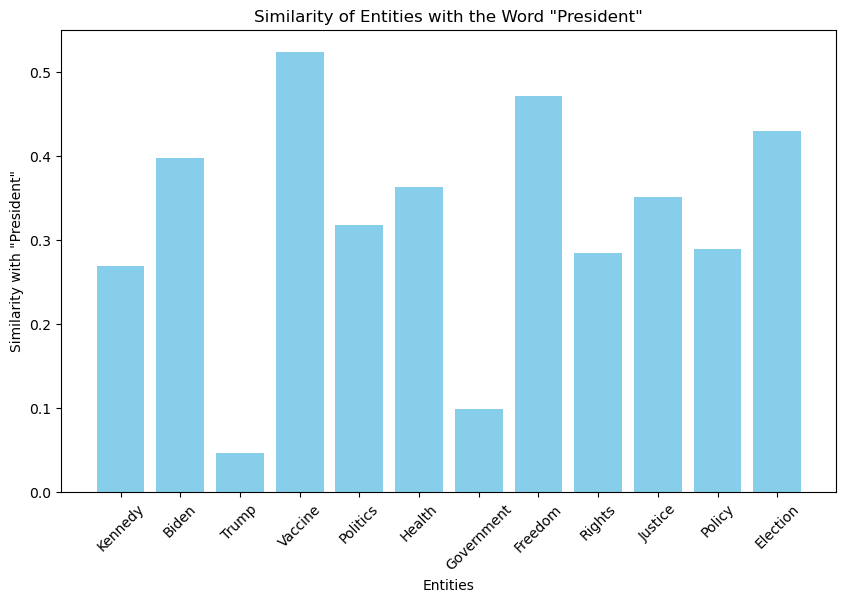

In [27]:
similarities = {name: entity.similarity(target_word) for name, entity in entities.items()}

plt.figure(figsize=(10, 6))
plt.bar(similarities.keys(), similarities.values(), color='skyblue')
plt.xlabel('Entities')
plt.ylabel('Similarity with "President"')
plt.title('Similarity of Entities with the Word "President"')
plt.xticks(rotation=45)
plt.show()